In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
import numpy as np
import pandas as pd
import os
import glob
from tqdm import tqdm

# 设置文件路径
download_path = '/content/drive/MyDrive/datasets_4186'
path_save = os.path.join(download_path, 'ORB_FINAL/save')
path_query = os.path.join(download_path, 'query_4186')
path_query_txt = os.path.join(download_path, 'query_txt_4186')
path_gallery = os.path.join(download_path, 'gallery_4186')
num_query = 20
num_gallery = 5000

In [ ]:
import pickle
name_query = glob.glob(path_query + '/*.jpg')
name_gallery = glob.glob(path_gallery + '/*.jpg')
name_query_txt = [path_query_txt+"/"+str(nq.split("query_4186/")[-1].split(".")[0])+".txt" for nq in name_query]
with open(path_save+'/variables.pkl', 'wb') as f:
    variables = (name_query, name_gallery, name_query_txt)
    pickle.dump(variables, f)

In [ ]:
import pickle
with open(path_save+'/variables.pkl', 'rb') as f:
    name_query, name_gallery, name_query_txt = pickle.load(f)

默认参数完成-------------



特征提取

In [ ]:
import cv2
import os
import numpy as np

def box_crop(i):
  query_img_txt_path = name_query_txt[i]
  with open(query_img_txt_path, 'r') as f:
    x, y, w, h = map(int, f.readline().strip().split())
    return x, y, w, h
orb = cv2.ORB_create()

In [ ]:
import cv2
import os
import numpy as np
from tqdm import tqdm

orb = cv2.ORB_create()

def process_image(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hist, _ = np.histogram(hsv[:,:,0], bins=180, range=[0, 180])
    hist = hist.astype("float")
    hist /= (hsv.shape[0] * hsv.shape[1])
    return hist

num_query = len(name_query)
query_kps = [None for _ in range(num_query)]
query_descs = [None for _ in range(num_query)]
query_fods = [None for _ in range(num_query)]

for i in range(0,1):
    query_name = os.path.splitext(os.path.basename(name_query[i]))[0]
    query_folder = os.path.join(path_save, query_name)
    if not os.path.exists(query_folder):
        os.makedirs(query_folder)
    query_fods[i] = query_folder
    x, y, w, h = box_crop(i)
    query_img = cv2.imread(name_query[i])[y:y+h, x:x+w]
    query_hist = process_image(query_img)

distances = []
for j in [4001, 4005, 4015, 4018, 4035, 4039, 4042, 4047, 4051, 4066]:
    gallery_name = os.path.splitext(os.path.basename(name_gallery[j]))[0]
    gallery_img = cv2.imread(name_gallery[j])
    dists = []
    for k in range(0,gallery_img.shape[0]-query_img.shape[0],10):
        for l in range(0,gallery_img.shape[1]-query_img.shape[1],10):
            sub_img = gallery_img[k:k+query_img.shape[0],l:l+query_img.shape[1]]
            gallery_hist = process_image(sub_img)
            gallery_hist = gallery_hist.astype(np.float32)  # Convert to CV_32F
            query_hist_f32 = query_hist.astype(np.float32)  # Convert query hist to CV_32F
            dist = cv2.compareHist(query_hist_f32, gallery_hist, cv2.HISTCMP_CHISQR)
            dists.append(dist)
    distances.append((gallery_name, max(dists)))

distances.sort(key=lambda x: x[1])
top_20_matches = distances[:20]

# Print out the names and distances of the top 20 matches
for match in top_20_matches:
    print(f"Name: {match[0]}, Distance: {match[1]}")

Name: 1319, Distance: 53.233606085802
Name: 4705, Distance: 90.45173895976154
Name: 4055, Distance: 112.6683791919525
Name: 3856, Distance: 206.3274079644318
Name: 2619, Distance: 231.64217492887892
Name: 456, Distance: 262.2816921340272
Name: 3904, Distance: 389.47240160804563
Name: 1697, Distance: 663.0064014588427
Name: 143, Distance: 968.8658917287994
Name: 792, Distance: 1132.3587242238248


In [ ]:
import cv2
import os
import numpy as np
from tqdm import tqdm

orb = cv2.ORB_create()

num_query = len(name_query)
query_kps = [None for _ in range(num_query)]
query_descs = [None for _ in range(num_query)]
query_fods = [None for _ in range(num_query)]

for i in range(0,1):
    query_name = os.path.splitext(os.path.basename(name_query[i]))[0]
    query_folder = os.path.join(path_save, query_name)
    if not os.path.exists(query_folder):
        os.makedirs(query_folder)
    query_fods[i] = query_folder
    x, y, w, h = box_crop(i)
    query_img = cv2.imread(name_query[i])[y:y+h, x:x+w]

    # Extract keypoints and descriptors from the query image
    query_kp, query_desc = orb.detectAndCompute(query_img, None)
    query_kps[i] = query_kp
    query_descs[i] = np.array(query_desc)  # convert descriptor list to numpy array

distances = []
for j in tqdm(range(10)):
    gallery_name = os.path.splitext(os.path.basename(name_gallery[j]))[0]
    gallery_img = cv2.imread(name_gallery[j])
    dists = []
    for k in range(0,gallery_img.shape[0]-query_img.shape[0],10):
        for l in range(0,gallery_img.shape[1]-query_img.shape[1],10):
            sub_img = gallery_img[k:k+query_img.shape[0],l:l+query_img.shape[1]]

            # Extract keypoints and descriptors from the sub-image
            sub_kp, sub_desc = orb.detectAndCompute(sub_img, None)

            try:
              matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
              query_descs_scaled = np.uint8(query_descs[0] * 255.0 / np.max(query_descs[0]))
              sub_desc_scaled = np.uint8(sub_desc * 255.0 / np.max(sub_desc))
              matches = matcher.match(query_descs_scaled, sub_desc_scaled)

              FLANN_INDEX_KDTREE = 1
              index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
              search_params = dict(checks=50)
              flann = cv2.FlannBasedMatcher(index_params, search_params)
              matches = flann.knnMatch(query_descs_scaled.astype(np.float32), sub_desc_scaled.astype(np.float32), k=2)

              good_matches = []
              ratio_thresh = 0.75
              for m,n in matches:
                  if m.distance < ratio_thresh * n.distance:
                      good_matches.append(m)

              dist = sum([m.distance for m in good_matches]) / len(good_matches) if len(good_matches) > 0 else float('inf')
              dists.append(dist)
            except:
              pass
    distances.append((gallery_name, max(dists)))

distances.sort(key=lambda x: x[1])
top_20_matches = distances[:20]

# Print out the names and distances of the top 20 matches
for match in top_20_matches:
    print(f"Name: {match[0]}, Distance: {match[1]}")


100%|██████████| 10/10 [03:09<00:00, 18.93s/it]

Name: 760, Distance: inf
Name: 3148, Distance: inf
Name: 2252, Distance: inf
Name: 3290, Distance: inf
Name: 1191, Distance: inf
Name: 3584, Distance: inf
Name: 267, Distance: inf
Name: 1433, Distance: inf
Name: 175, Distance: inf
Name: 2955, Distance: inf


In [ ]:
import cv2
import os
import numpy as np
from tqdm import tqdm

orb = cv2.ORB_create()

num_query = len(name_query)
query_kps = [None for _ in range(num_query)]
query_descs = [None for _ in range(num_query)]
query_fods = [None for _ in range(num_query)]

for i in range(0,1):
    query_name = os.path.splitext(os.path.basename(name_query[i]))[0]
    query_folder = os.path.join(path_save, query_name)
    if not os.path.exists(query_folder):
        os.makedirs(query_folder)
    query_fods[i] = query_folder
    x, y, w, h = box_crop(i)
    query_img = cv2.imread(name_query[i])[y:y+h, x:x+w]

    # Extract keypoints and descriptors from the query image
    query_kp, query_desc = orb.detectAndCompute(query_img, None)
    query_kps[i] = query_kp
    query_descs[i] = np.array(query_desc)  # convert descriptor list to numpy array

distances = []
for j in [4001, 4005, 4015, 4018, 4035, 4039, 4042, 4047, 4051, 4066]:
    gallery_name = os.path.splitext(os.path.basename(name_gallery[j]))[0]
    gallery_img = cv2.imread(name_gallery[j])
    dists = []
    for k in range(0,gallery_img.shape[0]-query_img.shape[0],10):
        for l in range(0,gallery_img.shape[1]-query_img.shape[1],10):
            sub_img = gallery_img[k:k+query_img.shape[0],l:l+query_img.shape[1]]

            # Extract keypoints and descriptors from the sub-image
            sub_kp, sub_desc = orb.detectAndCompute(sub_img, None)

            try:
              matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
              query_descs_scaled = np.uint8(query_descs[0] * 255.0 / np.max(query_descs[0]))
              sub_desc_scaled = np.uint8(sub_desc * 255.0 / np.max(sub_desc))
              matches = matcher.match(query_descs_scaled, sub_desc_scaled)

              FLANN_INDEX_KDTREE = 1
              index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
              search_params = dict(checks=50)
              flann = cv2.FlannBasedMatcher(index_params, search_params)
              matches = flann.knnMatch(query_descs_scaled.astype(np.float32), sub_desc_scaled.astype(np.float32), k=2)

              good_matches = []
              ratio_thresh = 0.75
              for m,n in matches:
                  if m.distance < ratio_thresh * n.distance:
                      good_matches.append(m)

              dist = sum([m.distance for m in good_matches]) / len(good_matches) if len(good_matches) > 0 else float('inf')
              dists.append(dist)
            except:
              pass
    distances.append((gallery_name, max(dists)))

distances.sort(key=lambda x: x[1])
top_20_matches = distances[:20]

# Print out the names and distances of the top 20 matches
for match in top_20_matches:
    print(f"Name: {match[0]}, Distance: {match[1]}")

Name: 3856, Distance: inf
Name: 4055, Distance: inf
Name: 1697, Distance: inf
Name: 456, Distance: inf
Name: 143, Distance: inf
Name: 4705, Distance: inf
Name: 3904, Distance: inf
Name: 792, Distance: inf
Name: 2619, Distance: inf
Name: 1319, Distance: inf


In [ ]:
import cv2
import os
import numpy as np
from tqdm import tqdm

sift = cv2.SIFT_create()

num_query = len(name_query)
query_kps = [None for _ in range(num_query)]
query_descs = [None for _ in range(num_query)]
query_fods = [None for _ in range(num_query)]

for i in range(0,1):
    query_name = os.path.splitext(os.path.basename(name_query[i]))[0]
    query_folder = os.path.join(path_save, query_name)
    if not os.path.exists(query_folder):
        os.makedirs(query_folder)
    query_fods[i] = query_folder
    x, y, w, h = box_crop(i)
    query_img = cv2.imread(name_query[i])[y:y+h, x:x+w]

    # Extract keypoints and descriptors from the query image
    query_kp, query_desc = sift.detectAndCompute(query_img, None)
    query_kps[i] = query_kp
    query_descs[i] = np.array(query_desc)  # convert descriptor list to numpy array

distances = []
for j in tqdm([4001, 4005, 4015, 4018, 4035, 4039, 4042, 4047, 4051, 4066]):
    gallery_name = os.path.splitext(os.path.basename(name_gallery[j]))[0]
    gallery_img = cv2.imread(name_gallery[j])
    dists = []
    for k in range(0,gallery_img.shape[0]-query_img.shape[0],10):
        for l in range(0,gallery_img.shape[1]-query_img.shape[1],10):
            sub_img = gallery_img[k:k+query_img.shape[0],l:l+query_img.shape[1]]

            # Extract keypoints and descriptors from the sub-image
            sub_kp, sub_desc = sift.detectAndCompute(sub_img, None)

            try:
              matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
              query_descs_scaled = np.uint8(query_descs[0] * 255.0 / np.max(query_descs[0]))
              sub_desc_scaled = np.uint8(sub_desc * 255.0 / np.max(sub_desc))
              matches = matcher.match(query_descs_scaled, sub_desc_scaled)

              FLANN_INDEX_KDTREE = 1
              index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
              search_params = dict(checks=50)
              flann = cv2.FlannBasedMatcher(index_params, search_params)
              matches = flann.knnMatch(query_descs_scaled.astype(np.float32), sub_desc_scaled.astype(np.float32), k=2)

              good_matches = []
              ratio_thresh = 0.75
              for m,n in matches:
                  if m.distance < ratio_thresh * n.distance:
                      good_matches.append(m)

              dist = sum([m.distance for m in good_matches]) / len(good_matches) if len(good_matches) > 0 else float('inf')
              dists.append(dist)
            except:
              pass
    distances.append((gallery_name, max(dists)))

distances.sort(key=lambda x: x[1])
top_20_matches = distances[:20]

# Print out the names and distances of the top 20 matches
for match in top_20_matches:
    print(f"Name: {match[0]}, Distance: {match[1]}")


Name: 3856, Distance: inf
Name: 4055, Distance: inf
Name: 1697, Distance: inf
Name: 456, Distance: inf
Name: 143, Distance: inf
Name: 4705, Distance: inf
Name: 3904, Distance: inf
Name: 792, Distance: inf
Name: 2619, Distance: inf
Name: 1319, Distance: inf


In [ ]:
cnt=0
for e in distances:
  cnt+=1
  if e[0] =="143":
    print(cnt)

In [ ]:
surf = cv2.xfeatures2d.SURF_create(800)

error: ignored

In [ ]:
t=[]
for j in tqdm(range(0,5000)):
    x = name_gallery[j]
    s = x.split("_4186/")[-1]
    b = s.split(".jpg")[0]
    b=int(b)
    if b in [143,456,792,1319,1697,2619,3856,3904,4055,4705]:
      t.append(j)
print(t)

100%|██████████| 5000/5000 [00:00<00:00, 434678.94it/s]

[4001, 4005, 4015, 4018, 4035, 4039, 4042, 4047, 4051, 4066]


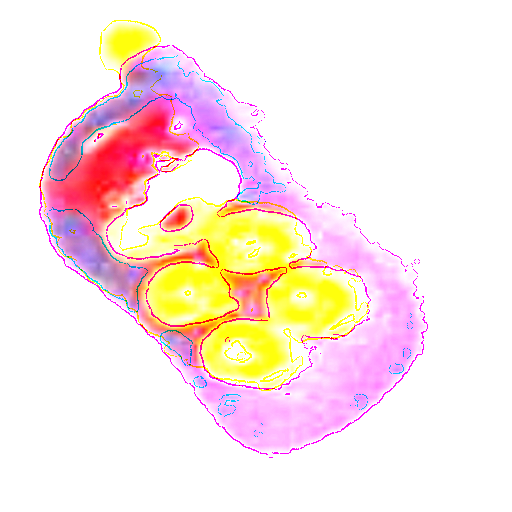

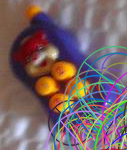

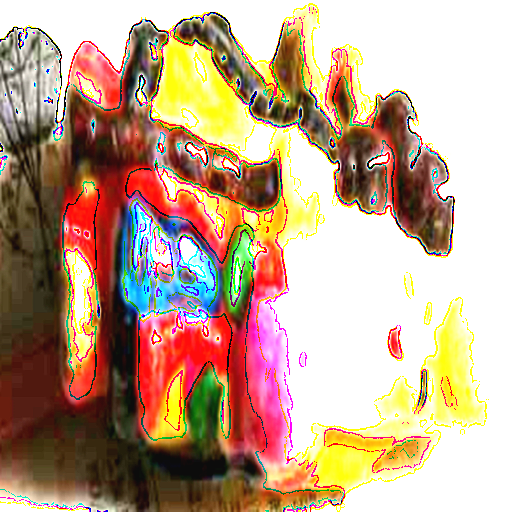

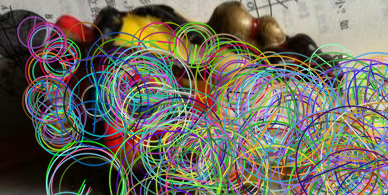

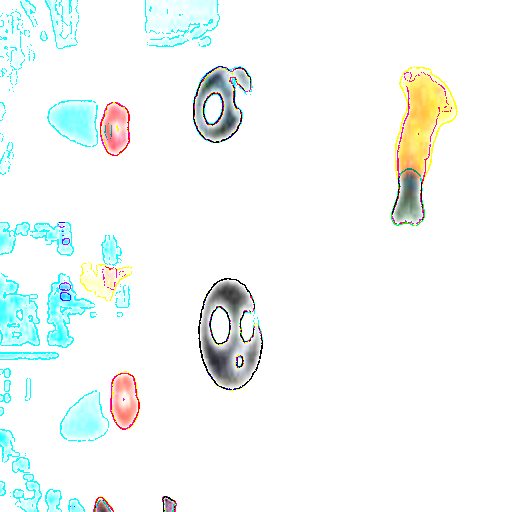

...

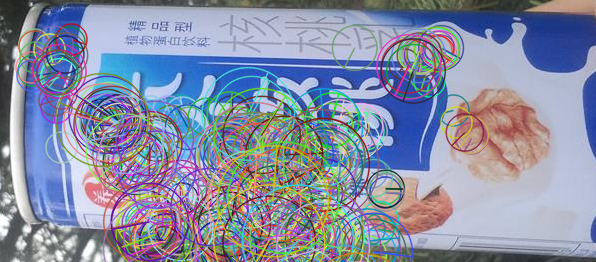

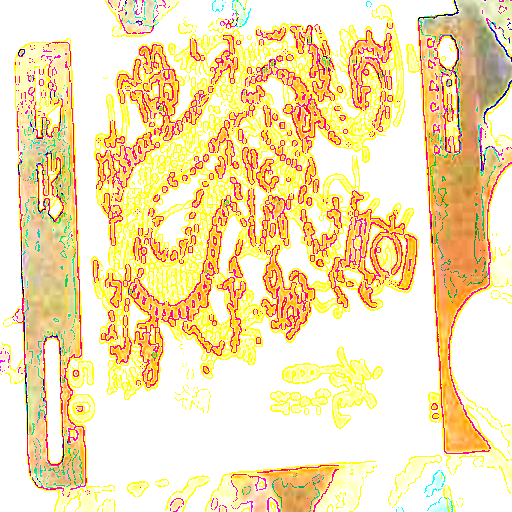

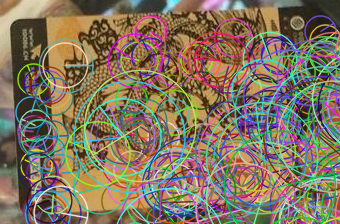

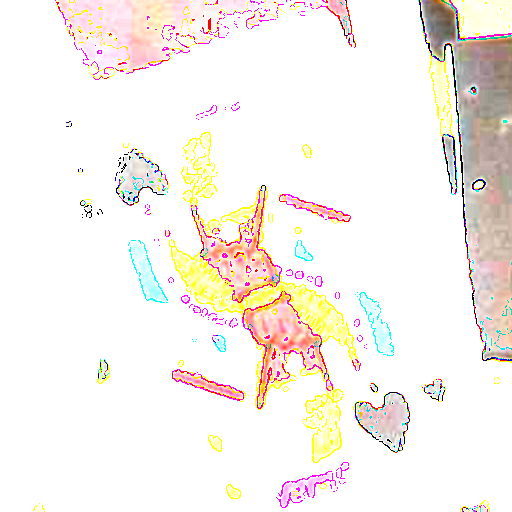

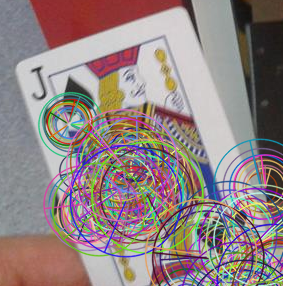

In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow
orb = cv2.ORB_create()

def process_image(image):
    kp, des = orb.detectAndCompute(image, None)
    cv2_imshow(image)
    return kp, des

num_query = len(name_query)
query_kps = [None for _ in range(num_query)]
query_descs = [None for _ in range(num_query)]
query_fods = [None for _ in range(num_query)]

for i in range(20):

    query_name = os.path.splitext(os.path.basename(name_query[i]))[0]
    query_folder = os.path.join(path_save, query_name)
    if not os.path.exists(query_folder):
        os.makedirs(query_folder)
    query_fods[i] = query_folder
    x, y, w, h = box_crop(i)
    query_img = cv2.imread(name_query[i])[y:y+h, x:x+w]
    query_kps[i],query_descs[i] = process_image(query_img)
    query_img_kps = cv2.drawKeypoints(query_img, query_kps[i], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    cv2_imshow(query_img_kps)

In [ ]:
import cv2
import os
from google.colab.patches import cv2_imshow

sift = cv2.xfeatures2d.SIFT_create()
matches_dict = {}
for i in range(2,3):
    query_name = os.path.splitext(os.path.basename(name_query[i]))[0]
    query_folder = os.path.join(path_save, query_name)
    if not os.path.exists(query_folder):
        os.makedirs(query_folder)
    query_fods[i] = query_folder
    x, y, w, h = box_crop(i)
    query_img = cv2.imread(name_query[i])[y:y+h, x:x+w]
    q_d,q_c = process_image(query_img)
    matches_dict[i]={}
    for j in tqdm(range(num_gallery), desc='Processing gallery images'):
        gallery_img = cv2.imread(name_gallery[j])
        g_d, g_c = process_image(gallery_img)

        matcher = cv2.FlannBasedMatcher()

        matches = matcher.knnMatch(np.float32(q_c),np.float32(g_c),k=2)
        good_matches = []
        for m,n in matches:
          if m.distance < 0.8 * n.distance:
            good_matches.append(m)
            break
        matches_dict[i][j] = len(good_matches)
    sorted_matches = sorted(matches_dict[i].items(), key=lambda x: x[1], reverse=True)
    print(f'Top 10 matches for query image {i}:')
    for idx, (key, value) in enumerate(sorted_matches[:10]):
      print(f'{idx+1}. Gallery image {key}: {value}')

Processing gallery images:   0%|          | 18/5000 [00:19<1:27:41,  1.06s/it]


KeyboardInterrupt: ignored

In [ ]:
np.save(path_save+'/query_descs.npy', query_descs)
np.save(path_save+'/query_fods.npy', query_fods)

/usr/local/lib/python3.9/dist-packages/numpy/lib/npyio.py:518: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [ ]:
gallery_descs = [None for _ in range(num_gallery)]
for j in tqdm(range(num_gallery), desc='Processing gallery images'):
    gallery_img = cv2.imread(name_gallery[j])
    gallery_img_gray = cv2.cvtColor(gallery_img, cv2.COLOR_BGR2GRAY)
    gallery_kp, gallery_desc = orb.detectAndCompute(gallery_img_gray, None)

    gallery_descs[j] = np.float32(gallery_desc)
np.save(path_save+'/gallery_descs.npy', gallery_descs)

Processing gallery images:   1%|▏         | 64/5000 [00:13<17:32,  4.69it/s]


KeyboardInterrupt: ignored

In [ ]:
import os
import cv2
import pickle
import numpy as np
from tqdm import tqdm

query_descs = np.load(path_save + '/query_descs.npy',allow_pickle=True)
query_fods = np.load(path_save + '/query_fods.npy',allow_pickle=True)
gallery_descs = np.load(path_save + '/gallery_descs.npy',allow_pickle=True)

matches_dict = {}
for i in range(2,3):
    query_desc = query_descs[i]
    matches_dict[i]={}
    for j in tqdm(range(num_gallery), desc='Processing gallery images for query {}'.format(i)):
        gallery_desc = gallery_descs[j]

        matcher = cv2.FlannBasedMatcher()
        matches = matcher.knnMatch(query_desc,gallery_desc , k=2)
        good_matches = []
        for m,n in matches:
          if m.distance < 0.7 * n.distance:
            good_matches.append(m)
            break
        matches_dict[i][j] = len(good_matches)
import pickle
with open(path_save+'/matches_dict.pickle', 'wb') as f:
    pickle.dump(matches_dict, f)

Processing gallery images for query 2: 100%|██████████| 5000/5000 [00:34<00:00, 146.22it/s]


In [ ]:
import pickle
with open(path_save+'/matches_dict.pickle', 'rb') as f:
    matches_dict = pickle.load(f)
query_fods = np.load(path_save+'/query_fods.npy',allow_pickle=True)
orb = cv2.ORB_create()
matches_dict_sorted = {}
for query_name, query_matches in matches_dict.items():
    matches_sorted = sorted(query_matches.items(), key=lambda x: x[1], reverse=True)
    matches_dict_sorted[query_name] = matches_sorted

In [ ]:
for i in range(2,3):
    query_folder = query_fods[i]
    query_name = os.path.basename(name_query[i])
    x, y, w, h = box_crop(i)
    query_img = cv2.imread(name_query[i])[y:y+h, x:x+w]
    query_img_gray = query_img
    query_kp, query_des = orb.detectAndCompute(query_img_gray, None)
    ranklist = []

    top_matches = matches_dict_sorted[i][:20]
    top_gallery_images = [name_gallery[i[0]] for i in top_matches]
    for j, gallery_img_path in tqdm(enumerate(top_gallery_images), desc='Comparing images', total=len(top_gallery_images)):
        gallery_img = cv2.imread(gallery_img_path)
        gallery_img_gray = gallery_img

        gallery_kp, gallery_des = orb.detectAndCompute(gallery_img_gray, None)
        matcher = cv2.FlannBasedMatcher()
        query_des = np.float32(query_des)
        gallery_des = np.float32(gallery_des)
        matches = matcher.knnMatch(query_des, gallery_des, k=2)

        # Apply ratio test
        good = []
        for m, n in matches:
            if m.distance < 0.75 * n.distance:
                good.append([m])

        # Draw matches
        match_img = cv2.drawMatches(query_img_gray, query_kp, gallery_img_gray, gallery_kp, good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

        gallery_name = os.path.basename(gallery_img_path).split('.')[0]
        img_name = '{}_rank{}_{}.jpg'.format(query_name.split('.')[0], j + 1, gallery_name)
        p = os.path.join(query_folder, img_name)
        cv2.imwrite(p, match_img)
        ranklist.append((name_gallery.index(gallery_img_path), len(good)))
    ranklist = sorted(ranklist, key=lambda x: x[1], reverse=True)
    with open(os.path.join(query_folder, 'ranklist.txt'), 'w') as f:
        for match in ranklist:
            gallery_index = np.where(np.array(name_gallery) == name_gallery[match[0]])[0][0]
            f.write("Gallery image index: {}, Number of good matching points: {}\n".format(gallery_index, match[1]))


Comparing images: 100%|██████████| 20/20 [00:01<00:00, 12.67it/s]


In [ ]:
print(query_fods[2])
print(matches_dict_sorted)

/content/drive/MyDrive/datasets_4186/ORB_FINAL/save/2176
{2: [(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (11, 1), (12, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (20, 1), (21, 1), (23, 1), (24, 1), (25, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (33, 1), (34, 1), (35, 1), (36, 1), (38, 1), (39, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (57, 1), (58, 1), (60, 1), (61, 1), (62, 1), (63, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (76, 1), (78, 1), (80, 1), (82, 1), (83, 1), (84, 1), (85, 1), (86, 1), (88, 1), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 1), (100, 1), (101, 1), (102, 1), (103, 1), (105, 1), (106, 1), (107, 1), (108, 1), (109, 1), (110, 1), (112, 1), (113, 1), (116, 1), (117, 1), (118, 1), (120, 1), (121, 1), (122, 1), (123, 1), (124, 1), (125, 1), (126, 1), (127, 1